In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from transformers import pipeline
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud
import re
from bertopic import BERTopic

In [6]:
# Load the dataset
df = pd.read_csv("hamlet_paraphrased.csv")
df["dialogue"] = df["dialogue"].fillna("")
df["paraphrased"] = df["paraphrased"].fillna("")

In [7]:
# Shakespeare Simplification Metrics
def avg_word_length(text):
    words = text.split()
    return sum(len(word) for word in words) / len(words) if words else 0

def avg_sentence_length(text):
    sentences = re.split(r'[.!?]', text)
    sentences = [s for s in sentences if s.strip()]
    return sum(len(s.split()) for s in sentences) / len(sentences) if sentences else 0

def vocab_richness(text):
    words = text.split()
    return len(set(words)) / len(words) if words else 0

df["original_word_len"] = df["dialogue"].apply(avg_word_length)
df["paraphrased_word_len"] = df["paraphrased"].apply(avg_word_length)
df["original_sent_len"] = df["dialogue"].apply(avg_sentence_length)
df["paraphrased_sent_len"] = df["paraphrased"].apply(avg_sentence_length)
df["original_vocab"] = df["dialogue"].apply(vocab_richness)
df["paraphrased_vocab"] = df["paraphrased"].apply(vocab_richness)

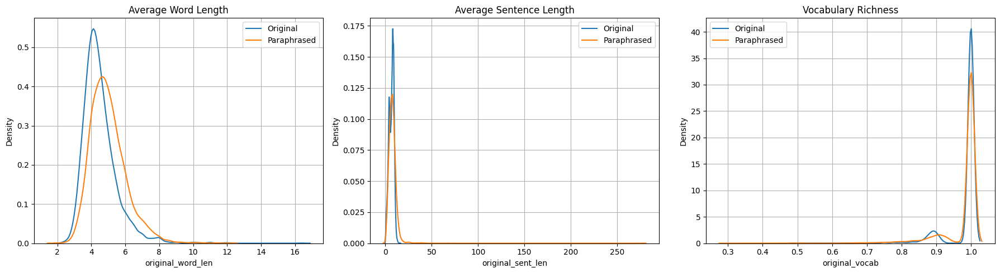

In [8]:
# Visualization
fig, axs = plt.subplots(1, 3, figsize=(18, 5))
sns.kdeplot(df["original_word_len"], label="Original", ax=axs[0])
sns.kdeplot(df["paraphrased_word_len"], label="Paraphrased", ax=axs[0])
axs[0].set_title("Average Word Length")

sns.kdeplot(df["original_sent_len"], label="Original", ax=axs[1])
sns.kdeplot(df["paraphrased_sent_len"], label="Paraphrased", ax=axs[1])
axs[1].set_title("Average Sentence Length")

sns.kdeplot(df["original_vocab"], label="Original", ax=axs[2])
sns.kdeplot(df["paraphrased_vocab"], label="Paraphrased", ax=axs[2])
axs[2].set_title("Vocabulary Richness")

for ax in axs: ax.legend(); ax.grid(True)
plt.tight_layout()
plt.show()

In [9]:
# Sentiment Analysis with Transformers
sentiment_pipeline = pipeline("sentiment-analysis")
df["sentiment_original"] = df["dialogue"].apply(lambda x: sentiment_pipeline(x)[0]["label"])
df["sentiment_paraphrased"] = df["paraphrased"].apply(lambda x: sentiment_pipeline(x)[0]["label"])
print(pd.crosstab(df["sentiment_original"], df["sentiment_paraphrased"]))

No model was supplied, defaulted to distilbert/distilbert-base-uncased-finetuned-sst-2-english and revision 714eb0f (https://huggingface.co/distilbert/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.
Device set to use cpu


sentiment_paraphrased  NEGATIVE  POSITIVE
sentiment_original                       
NEGATIVE                   1628       593
POSITIVE                    451      1545


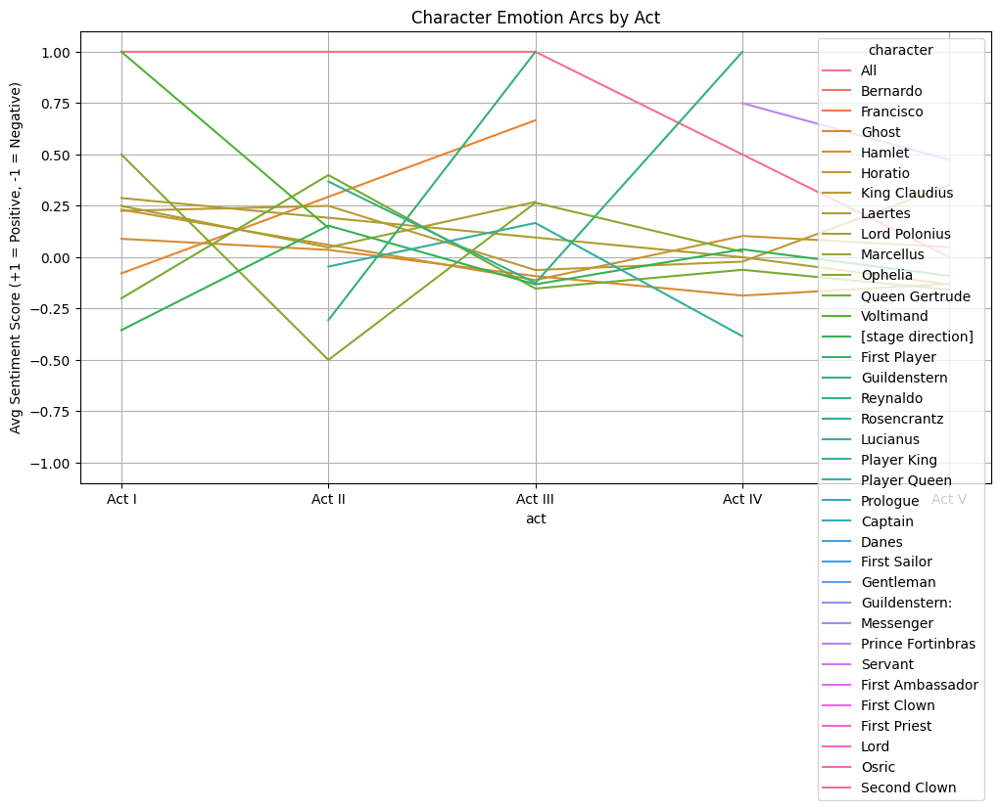

In [12]:
# Character Emotion Profiles
df["sentiment_score"] = df["paraphrased"].apply(lambda x: 1 if "POSITIVE" in sentiment_pipeline(x)[0]["label"] else -1)
emotion_trends = df.groupby(["act", "character"])["sentiment_score"].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(data=emotion_trends, x="act", y="sentiment_score", hue="character")
plt.title("Character Emotion Arcs by Act")
plt.ylabel("Avg Sentiment Score (+1 = Positive, -1 = Negative)")
plt.grid(True)
plt.show()

In [13]:
# Topic Modeling (BERTopic)
topic_model = BERTopic()
topics, probs = topic_model.fit_transform(df["paraphrased"].tolist())
df["topic"] = topics
topic_model.visualize_barchart(top_n_topics=10)


In [14]:
topic_model_original = BERTopic()
topics_orig, _ = topic_model_original.fit_transform(df["dialogue"].fillna("").tolist())
df["topic_original"] = topics_orig
topic_model.visualize_barchart(top_n_topics=10)


In [17]:
from bertopic import BERTopic
import pandas as pd

# Load data
df = pd.read_csv("hamlet_paraphrased.csv")

# Fill missing values
df["paraphrased"] = df["paraphrased"].fillna("")
df["dialogue"] = df["dialogue"].fillna("")

# Run BERTopic on paraphrased text
topic_model = BERTopic()
topics_paraphrased, _ = topic_model.fit_transform(df["paraphrased"])
df["topic"] = topics_paraphrased



In [18]:
# Run BERTopic on original text
topic_model_orig = BERTopic()
topics_original, _ = topic_model_orig.fit_transform(df["dialogue"])
df["topic_original"] = topics_original


In [19]:
df.to_csv("hamlet_topics_labeled.csv", index=False)


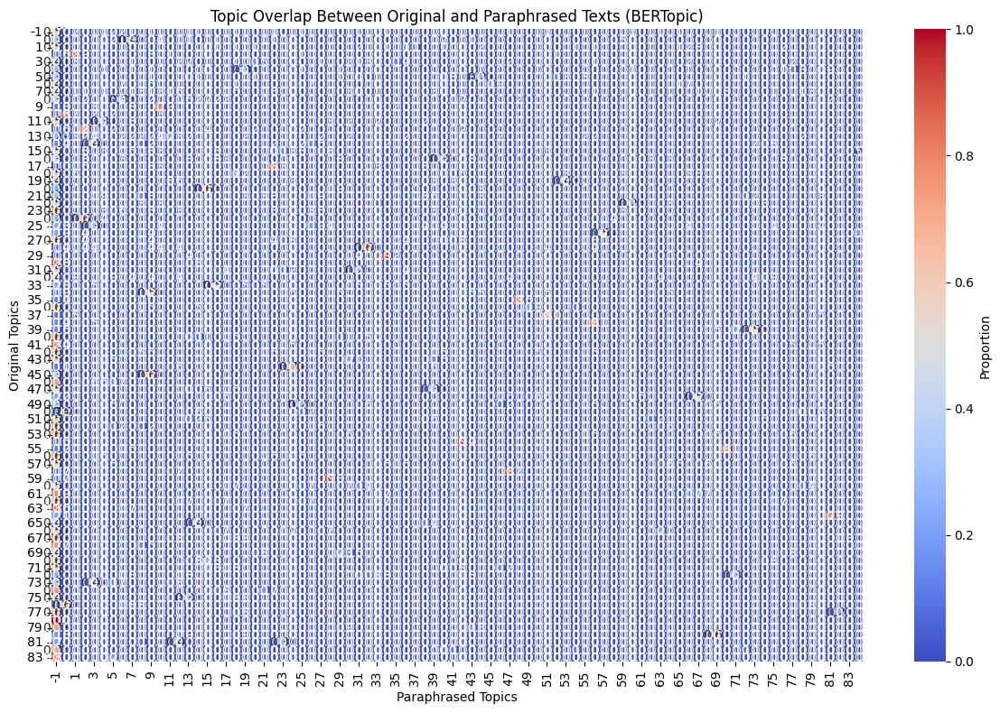

In [20]:
# Count and visualize topic overlap
import matplotlib.pyplot as plt
import seaborn as sns

topic_compare = df[["topic_original", "topic"]].value_counts().reset_index(name="count")
topic_pivot = topic_compare.pivot(index="topic_original", columns="topic", values="count").fillna(0)
normalized = topic_pivot.div(topic_pivot.sum(axis=1), axis=0)

plt.figure(figsize=(12, 8))
sns.heatmap(normalized, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Proportion'})
plt.title("Topic Overlap Between Original and Paraphrased Texts (BERTopic)")
plt.xlabel("Paraphrased Topics")
plt.ylabel("Original Topics")
plt.tight_layout()
plt.show()


In [22]:
from bertopic import BERTopic

# Get topic-word mappings from BERTopic
topics_info = topic_model.get_topics()

# Convert to prompt-friendly format
topic_prompts = {
    topic_id: ", ".join([word for word, _ in words])
    for topic_id, words in topics_info.items() if topic_id != -1
}


In [34]:
from langchain_ollama import OllamaLLM
from langchain.prompts import PromptTemplate
from bertopic import BERTopic

#Get topic keywords
topics = topic_model.get_topics()  # assumes topic_model is already fitted

#Convert topic index -> top words
topic_prompts = {
    topic_id: ", ".join([word for word, _ in words])
    for topic_id, words in topics.items()
    if topic_id != -1  # skip outliers
}

#Setup LangChain + tinyllama model
llm = OllamaLLM(model="tinyllama")

prompt = PromptTemplate.from_template(
    "Summarize the following topic keywords into a short and descriptive topic label:\n\n{keywords}\n\nLabel:"
)

chain = prompt | llm

#Generate topic labels
topic_labels = {}

for topic_id, keywords in topic_prompts.items():
    try:
        response = chain.invoke({"keywords": keywords})
        topic_labels[topic_id] = response.strip()
    except Exception as e:
        topic_labels[topic_id] = f"[ERROR] {str(e)}"

# Map back to DataFrame
df["topic_label"] = df["topic"].map(topic_labels)



In [35]:
print(pd.DataFrame.from_dict(topic_labels, orient="index", columns=["Topic Label"]))


                                          Topic Label
0   Narrative: A Family Tale Through Three Generat...
1   Title: "Hamlet, Shakespeare's Lament" - A Brie...
2   Topic Label: "King, Queen, Kings, Monarchs, Mo...
3   Topic Label: Provide Comfortable Living Space ...
4       Fairytale Features: Tales of Magic and Wonder
..                                                ...
76  Topic Label: "Murders, GoNZAGo, Killers, RuThl...
77  Topic Label: What's Up? - Hey! - Hi! - Going T...
78  Assistant Topic Label: Responsible AI Assistan...
79        Topic Label: Weed Management in Agriculture
80  Cultivating a Free and Equal Society with Humi...

[81 rows x 1 columns]


In [36]:
# Strip common prefixes and whitespace
df["topic_label_clean"] = df["topic_label"].str.replace(r'^(Topic Label:|Title:|Assistant Topic Label:)', '', regex=True).str.strip()


In [37]:
topic_summary = df.groupby("topic_label_clean").agg(
    num_lines=("dialogue", "count"),
    example_line=("dialogue", "first")
).reset_index().sort_values("num_lines", ascending=False)

print(topic_summary.head(10))


                                    topic_label_clean  num_lines  \
55  Narrative: A Family Tale Through Three Generat...        116   
7   "Hamlet, Shakespeare's Lament" - A Brief Analy...        109   
9   "King, Queen, Kings, Monarchs, Mobile Is, Mona...         92   
66  Provide Comfortable Living Space for Individua...         63   
42      Fairytale Features: Tales of Magic and Wonder         63   
56  Narrative: A Man's Journey Towards Self-Awaren...         61   
53  Narrative about "Wind, Sun, Sea, Mountains, St...         61   
52  Narrative Conversation - Uncovering the Myster...         60   
68  Research, Interactions, and Communication: Und...         58   
13  "Singing Rain: Troupe Performs Song, Sings Ins...         58   

                                         example_line  
55        So by his father lost: and this, I take it,  
7   Dared to the combat; in which our valiant Haml...  
9                                 Long live the king!  
66                         

In [39]:
df["short_label"] = df["topic_label_clean"].str.slice(0, 40) + "..."


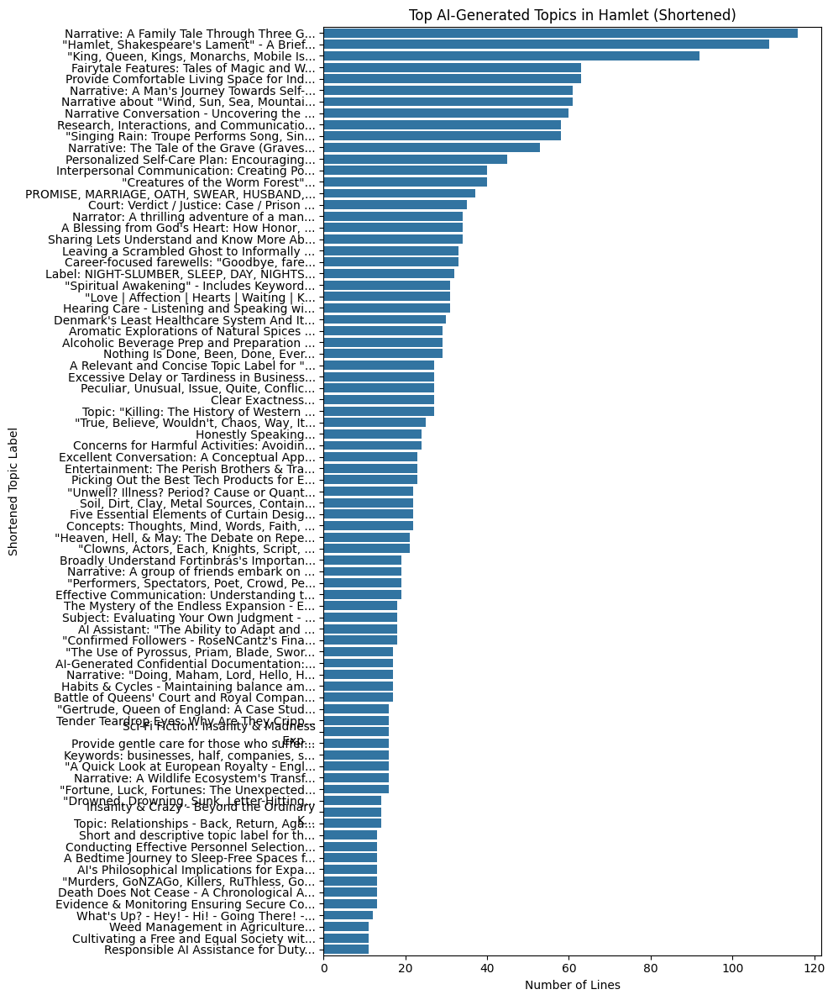

In [40]:
plt.figure(figsize=(10, 12))
sns.countplot(data=df, y="short_label", order=df["short_label"].value_counts().index)
plt.title("Top AI-Generated Topics in Hamlet (Shortened)")
plt.xlabel("Number of Lines")
plt.ylabel("Shortened Topic Label")
plt.tight_layout()
plt.show()


<Axes: ylabel='topic_label_clean'>

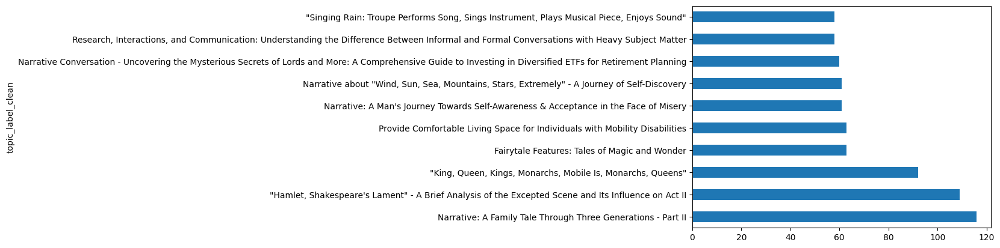

In [41]:
df["topic_label_clean"].value_counts().head(10).plot(kind="barh")


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\mosey\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


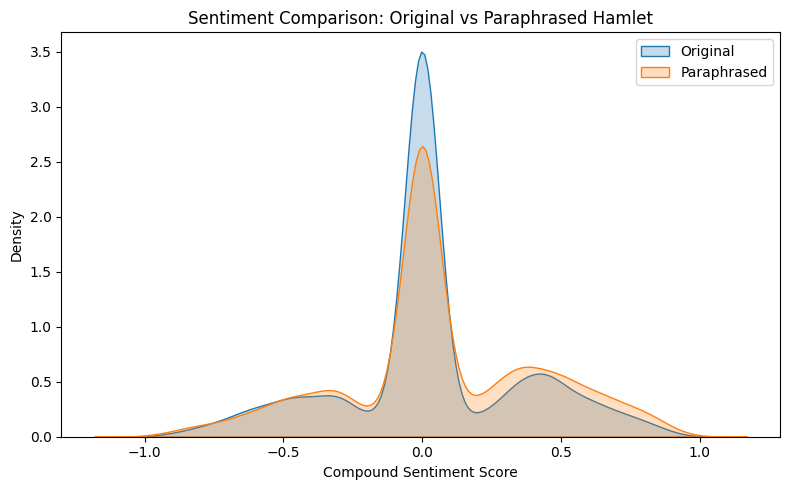

In [50]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
import matplotlib.pyplot as plt
import seaborn as sns

# Download lexicon once
nltk.download("vader_lexicon")
sia = SentimentIntensityAnalyzer()

# Apply sentiment analysis
df["sentiment_original"] = df["dialogue"].fillna("").apply(lambda x: sia.polarity_scores(x)["compound"])
df["sentiment_paraphrased"] = df["paraphrased"].fillna("").apply(lambda x: sia.polarity_scores(x)["compound"])

# Create comparison plot
plt.figure(figsize=(8, 5))
sns.kdeplot(df["sentiment_original"], label="Original", shade=True)
sns.kdeplot(df["sentiment_paraphrased"], label="Paraphrased", shade=True)
plt.title("Sentiment Comparison: Original vs Paraphrased Hamlet")
plt.xlabel("Compound Sentiment Score")
plt.legend()
plt.tight_layout()
plt.show()


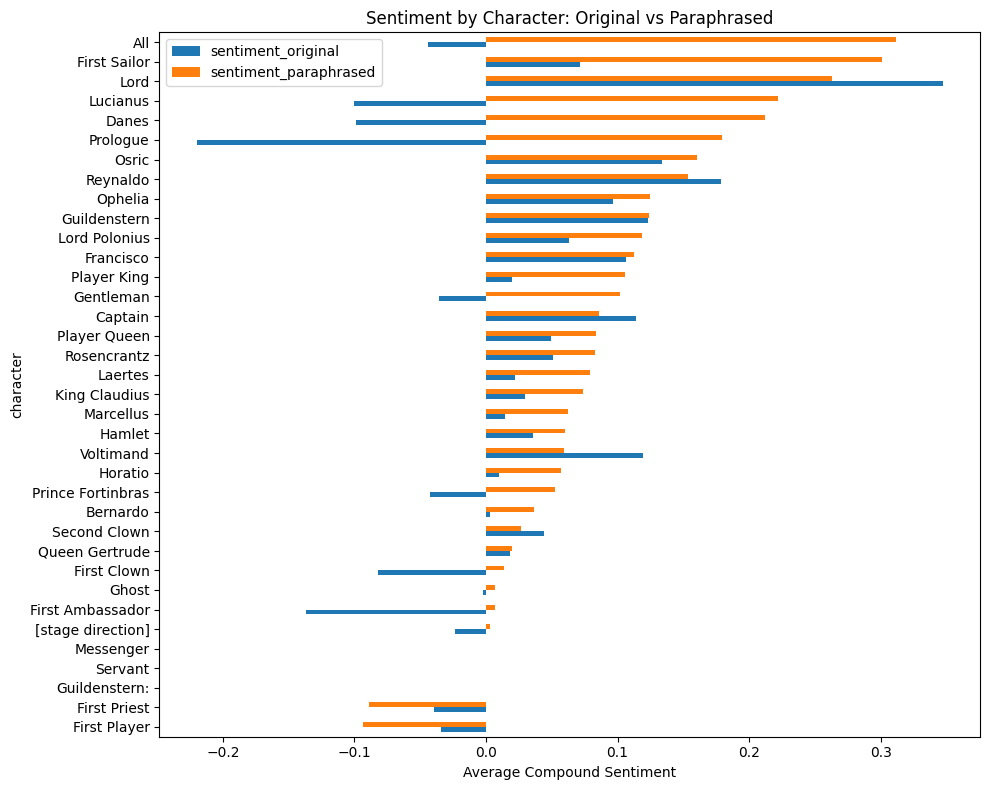

In [51]:
# Average sentiment per character
char_sentiment = df.groupby("character")[["sentiment_original", "sentiment_paraphrased"]].mean().sort_values("sentiment_paraphrased")

# Plot
char_sentiment.plot(kind="barh", figsize=(10, 8), title="Sentiment by Character: Original vs Paraphrased")
plt.xlabel("Average Compound Sentiment")
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

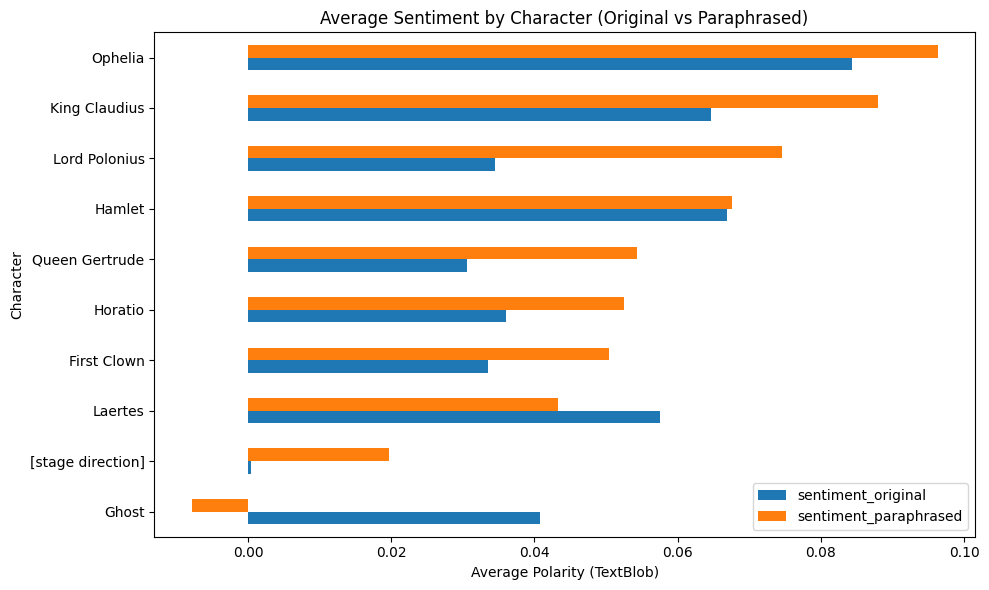

In [54]:
from textblob import TextBlob
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Make a safe copy
df_hamlet = df.copy()

# Calculate sentiment for both original and paraphrased
df_hamlet['sentiment_original'] = df_hamlet['dialogue'].fillna("").apply(lambda x: TextBlob(x).sentiment.polarity)
df_hamlet['sentiment_paraphrased'] = df_hamlet['paraphrased'].fillna("").apply(lambda x: TextBlob(x).sentiment.polarity)

# Group by character
sentiment_compare = df_hamlet.groupby("character")[["sentiment_original", "sentiment_paraphrased"]].mean().dropna()

#Focus on characters with the most lines
top_characters = df_hamlet["character"].value_counts().head(10).index
sentiment_compare = sentiment_compare.loc[sentiment_compare.index.isin(top_characters)]

# Plot side-by-side bars
sentiment_compare = sentiment_compare.sort_values("sentiment_paraphrased")

plt.figure(figsize=(10, 6))
sentiment_compare.plot(kind="barh", figsize=(10, 6))
plt.title("Average Sentiment by Character (Original vs Paraphrased)")
plt.xlabel("Average Polarity (TextBlob)")
plt.ylabel("Character")
plt.tight_layout()
plt.show()


In [64]:
from nltk.corpus import stopwords # Import the list of common stopwords (like "the", "is", "and") from NLTK
from nltk.tokenize import RegexpTokenizer # Import a regular-expression-based tokenizer
import nltk # Import the full NLTK (Natural Language Toolkit) library

# Ensure stopwords are downloaded 
nltk.download('stopwords')

tokenizer = RegexpTokenizer(r'\b[a-zA-Z]+\b')  # Matches words only

# New robust text cleaning function
def clean_text(text):
    tokens = tokenizer.tokenize(str(text).lower())
    tokens = [word for word in tokens if word not in stopwords.words('english')]
    return " ".join(tokens)

# Apply cleaning
df_hamlet['clean_text_dialogue'] = df_hamlet['dialogue'].apply(clean_text)
df_hamlet['clean_text_paraphrased'] = df_hamlet['paraphrased'].apply(clean_text)
print(df_hamlet[['dialogue', 'paraphrased', 'clean_text_dialogue', 'clean_text_paraphrased']].head())


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\mosey\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


                                       dialogue  \
0  FRANCISCO at his post. Enter to him BERNARDO   
1                                  Who's there?   
2   Nay, answer me: stand, and unfold yourself.   
3                           Long live the king!   
4                                     Bernardo?   

                                         paraphrased  \
0   Francisco is on duty. Bernard enters to see him.   
1   Who's here? (In this context, "there" implies...   
2   No, respond to me: Stand up straight, and rev...   
3                             Long live the monarch!   
4                             Bernardo, is that you?   

             clean_text_dialogue             clean_text_paraphrased  
0  francisco post enter bernardo  francisco duty bernard enters see  
1                                 context implies location replaced  
2        nay answer stand unfold      respond stand straight reveal  
3                 long live king                  long live monarch  
4     

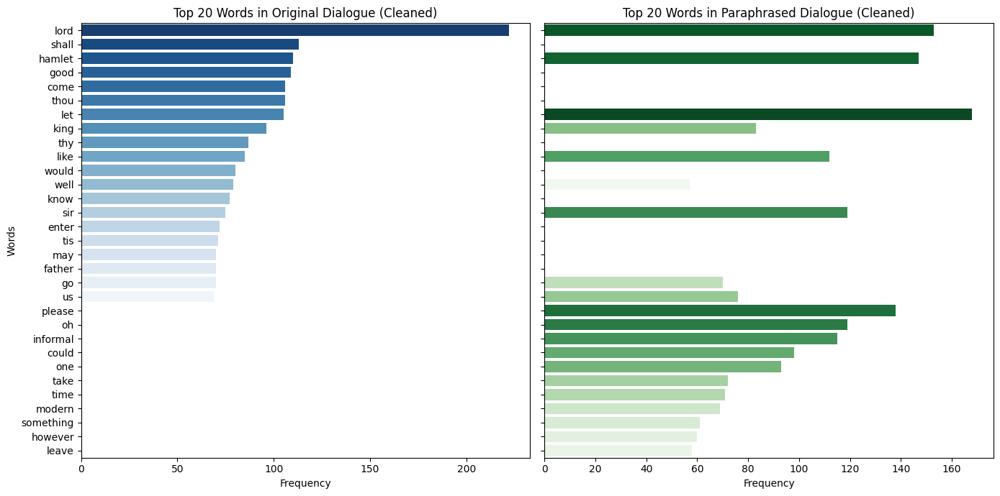

In [65]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure both cleaned columns are non-empty
df_hamlet = df_hamlet[
    df_hamlet["clean_text_dialogue"].str.strip().astype(bool) &
    df_hamlet["clean_text_paraphrased"].str.strip().astype(bool)
]

#Get top 20 word frequencies
def get_top_words(text_column, n=20):
    all_words = " ".join(df_hamlet[text_column]).split()
    return Counter(all_words).most_common(n)

# Get frequencies
top_dialogue = get_top_words("clean_text_dialogue")
top_paraphrased = get_top_words("clean_text_paraphrased")

# Unpack
words_d, counts_d = zip(*top_dialogue)
words_p, counts_p = zip(*top_paraphrased)

# Plotting
fig, axes = plt.subplots(1, 2, figsize=(14, 7), sharey=True)

sns.barplot(x=list(counts_d), y=list(words_d), ax=axes[0], palette="Blues_r")
axes[0].set_title("Top 20 Words in Original Dialogue (Cleaned)")
axes[0].set_xlabel("Frequency")
axes[0].set_ylabel("Words")

sns.barplot(x=list(counts_p), y=list(words_p), ax=axes[1], palette="Greens_r")
axes[1].set_title("Top 20 Words in Paraphrased Dialogue (Cleaned)")
axes[1].set_xlabel("Frequency")
axes[1].set_ylabel("")

plt.tight_layout()
plt.show()



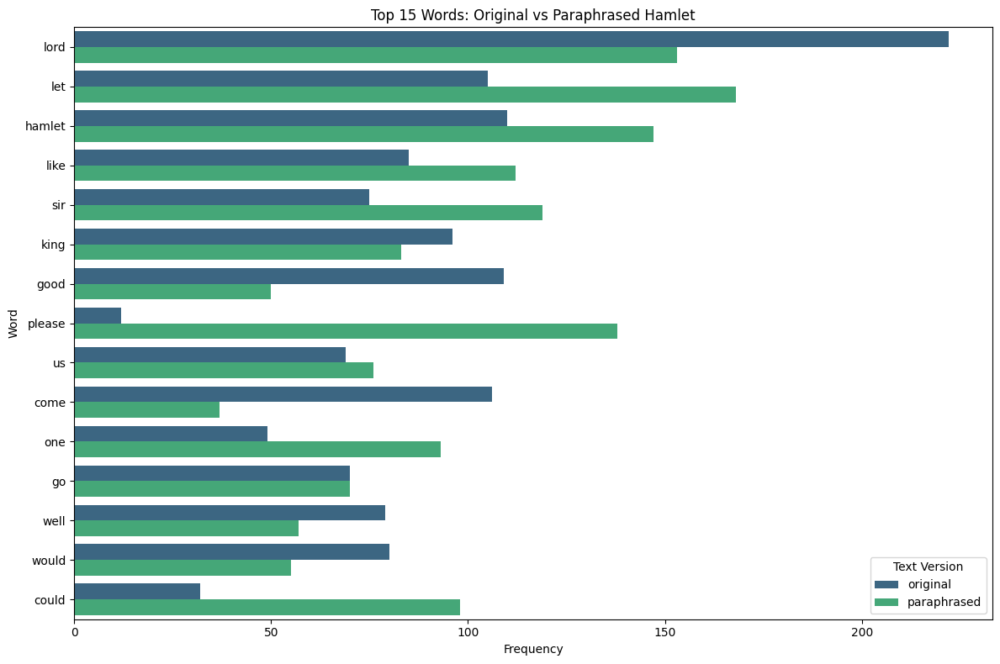

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Compute frequencies
words_original = " ".join(df_hamlet["clean_text_dialogue"]).split()
words_paraphrased = " ".join(df_hamlet["clean_text_paraphrased"]).split()

# Count
freq_orig = Counter(words_original)
freq_para = Counter(words_paraphrased)

# Combine into dataframe
all_words = set(freq_orig) | set(freq_para)
freq_df = pd.DataFrame({
    "word": list(all_words),
    "original": [freq_orig.get(w, 0) for w in all_words],
    "paraphrased": [freq_para.get(w, 0) for w in all_words]
})

# Pick top 15 most common overall words
freq_df["total"] = freq_df["original"] + freq_df["paraphrased"]
top_words = freq_df.sort_values("total", ascending=False).head(15)

# Melt to long format for grouped barplot
long_df = top_words.melt(id_vars="word", value_vars=["original", "paraphrased"], var_name="Version", value_name="Frequency")

# Plot
plt.figure(figsize=(12, 8))
sns.barplot(data=long_df, y="word", x="Frequency", hue="Version", palette="viridis")
plt.title("Top 15 Words: Original vs Paraphrased Hamlet")
plt.xlabel("Frequency")
plt.ylabel("Word")
plt.legend(title="Text Version")
plt.tight_layout()
plt.show()


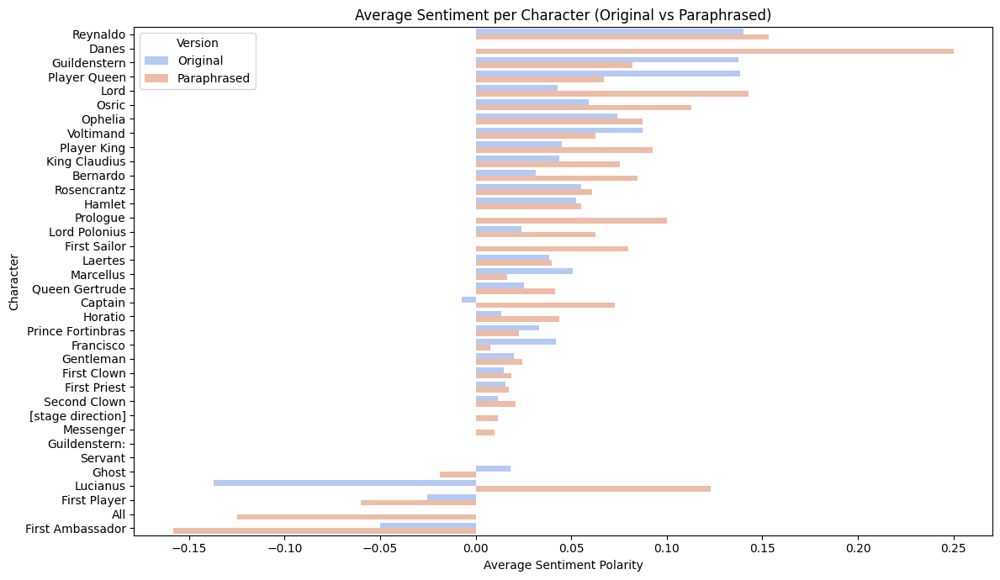

In [70]:
from textblob import TextBlob
import matplotlib.pyplot as plt
import seaborn as sns

# Copy and avoid SettingWithCopyWarning
df_hamlet = df_hamlet.copy()

# Compute sentiment for both original and paraphrased cleaned text
df_hamlet['sentiment_original'] = df_hamlet['clean_text_dialogue'].apply(lambda x: TextBlob(x).sentiment.polarity)
df_hamlet['sentiment_paraphrased'] = df_hamlet['clean_text_paraphrased'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Group by character
sentiment_avg = df_hamlet.groupby("character")[["sentiment_original", "sentiment_paraphrased"]].mean()

# Get top characters by average sentiment in either column
top_chars = sentiment_avg.mean(axis=1).sort_values(ascending=False).index
sentiment_top = sentiment_avg.loc[top_chars].reset_index()

# Melt for side-by-side plot
sentiment_melted = sentiment_top.melt(id_vars="character", 
                                      value_vars=["sentiment_original", "sentiment_paraphrased"],
                                      var_name="Version", value_name="Sentiment")

# Clean version labels
sentiment_melted["Version"] = sentiment_melted["Version"].map({
    "sentiment_original": "Original",
    "sentiment_paraphrased": "Paraphrased"
})

# Plot
plt.figure(figsize=(12, 7))
sns.barplot(data=sentiment_melted, y="character", x="Sentiment", hue="Version", palette="coolwarm")
plt.title("Average Sentiment per Character (Original vs Paraphrased)")
plt.xlabel("Average Sentiment Polarity")
plt.ylabel("Character")
plt.legend(title="Version")
plt.tight_layout()
plt.show()
